# 1 - Introduction

Le projet est de prédire le code type des produits de Rakuten à partir de données textuelles (désignation et description des produits) ainsi que des données images.<br>
Il est basé sur le challenge https://challengedata.ens.fr/challenges/35

Les données comprennent :
- 3 fichiers CSV (1 comprenant les données textuelles du jeu d'entrainement, 1 pour celles du test et 1 avec les labels du jeu d'entrainement)
- un dossier comprenant toutes les images 

Dans ce notebook nous faisons une première exploration des données.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

import cv2


from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.manifold import TSNE

import seaborn as sns

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\gabyd\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
# importation des données du jeu d'entraînement

data_path = "../data/raw/"
df = pd.read_csv(data_path+"X_train_update.csv").drop("Unnamed: 0", axis=1)
y = pd.read_csv(data_path+"Y_train_CVw08PX.csv")['prdtypecode']
df = pd.concat([y, df], axis=1)

print(df.info())
display(df.head())
print(f"La variable cible a {df["prdtypecode"].nunique()} modalités différentes.")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84916 entries, 0 to 84915
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   prdtypecode  84916 non-null  int64 
 1   designation  84916 non-null  object
 2   description  55116 non-null  object
 3   productid    84916 non-null  int64 
 4   imageid      84916 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 3.2+ MB
None


,prdtypecode,designation,description,productid,imageid
0,10,Olivia: Personalisiertes Notizbuch / 150 Seite...,NaN,3804725264,1263597046
1,2280,Journal Des Arts (Le) N° 133 Du 28/09/2001 - L...,NaN,436067568,1008141237
2,50,Grand Stylet Ergonomique Bleu Gamepad Nintendo...,PILOT STYLE Touch Pen de marque Speedlink est ...,201115110,938777978
3,1280,Peluche Donald - Europe - Disneyland 2000 (Mar...,NaN,50418756,457047496
4,2705,La Guerre Des Tuques,Luc a des id&eacute;es de grandeur. Il veut or...,278535884,1077757786


La variable cible a 27 modalités différentes.


Il n'y a pas toujours de descriptions mais les designations ne sont jamais NaN, ni les productid et les imageid qui vont nous servir à récupérer les images car les noms des fichiers images sont de la forme image_*imageid*\_product_*productid*.jpg <br>
Nous allons vérifier que chaque porductid et imageid est unique et récupérer les chemins des images dans la variable "image".

In [3]:
print(f"Il y a {df['productid'].duplicated(keep=False).sum()} duplicata pour productid")
print(f"Il y a {df['imageid'].duplicated(keep=False).sum()} duplicata pour imageid")

# on enregistre le chemin de l'image correspondant à chaque article dans une colonne image
df['image'] = data_path +"images/image_train/image_" + df['imageid'].astype('str') + '_product_' + df['productid'].astype('str') +'.jpg'

Il y a 0 duplicata pour productid
Il y a 0 duplicata pour imageid


Les productid sont tous uniques on peut donc réindexer df par cette colonne. Les imageid ne sont plus nécessaire maintenant qu'on a récupérer le chemin on va donc supprimer la colonne imageid.

In [4]:
df = df.set_index("productid").drop('imageid', axis=1)

# 2 - Nettoyage du texte


#### ajouter le heatmap de Xiasong effectué sur les mots parasites

En regardant les designations et les descriptions on peut remarquer que certains textes comportent des balises html, des entités html et des caractères qui semblent mals encodés. Nous allons donc écrire une fonction qui permet de nettoyer le texte à l'aide des librairie regex, html (pour traîter les entités html) et ftfy et unicodedata (pour la gestion de l'encodage).

In [5]:
import regex as reg
import html, ftfy, unicodedata

# Fonction pour nettoyer et standardiser les données textuelles:
def nettoyer_texte(text):
    if pd.isna(text): return ""
    s = str(text)
    s = reg.sub(r"<[^>]+>", " ", s)          # Supprime HTML
    s = html.unescape(s)                     # Décode entités HTML
    s = ftfy.fix_text(s)                     # Corrige texte cassé
    s = unicodedata.normalize("NFC", s)      # Normalise Unicode
    s = reg.sub(r"(?<!\d)\.(?!\d)", " ", s)  # Supprime points non numériques
    s = s.replace("/", " ")
    s = s.replace("*", " ")
    s = s.replace(":", " ")
    s = s.replace("-", " ")
    s = s.replace("////", " ")    
    s = reg.sub(r"\s+", " ", s).strip()     # Nettoie espaces et casse
    return s

# Le texte de ce produit rencontre les problèmes décrits nous allons donc tester la fonction de nettoyage dessus
productid = 4108914287                      
description = df.iloc[14]['description']

print(f"--- productid {productid} [texte original] ---")
print(description)
print("\n" + "="*40 + "\n")
print(f"--- productid {productid} [texte nettoyé] ---")
print(nettoyer_texte(description))

--- productid 4108914287 [texte original] ---
MATELAS:<br />Â· Accueil : Ferme .<br />Â· Soutien : Très Ferme .<br />Â· Technologie matelas : Face été &#43; à¢me en Mousse Poli Lattex Dernière Génération Indéformable Très Haute Résilience - Face Hiver 45 cm de Mousse à  Mémoire de Forme Très Haute Densité 60 Kg/m3 &#34; Massante&#34;<br />Â· Épaisseur du matelas : &#43;/- 20 cm.<br />Â· REPOS PLUS SAIN grà¢ce au Traitement Anti-acariens / anti-bactérien / Anti-moisissures.<br />Â· Très Bonne Indépendance de couchage.<br />Â· DORMEZ TRANQUILLE avec la Garantie 5 ans.  Il est Compatible avec les Sommiers Mécaniques et électriques<br />Coutil:<br />Â· Coutil stretch matelassé de 290 gr/m2 de Polyester avec traitement Sanitized. Faces de couchage Réversibles - Déhoussable sur 3 Cà¿tés et Housse Lavable à  30Â° position Lavage à  la main Délicat -<br />Â· SANITIZED : Traitement antibactérien et anti-moisissures diminuant également le développement des odeurs.<br />Structure et garnissage du

Nous pouvons vérifier si cette fonction permet de detecter des doublons textuelles supplémentaire

In [6]:
df["cleaned_designation"] = df["designation"].apply(nettoyer_texte)
df["cleaned_description"] = df["description"].apply(nettoyer_texte)

print(f"Avant nettoyage il y a {df[["designation", "description", "prdtypecode"]].duplicated(keep=False).sum()} duplicata textuels.")
print(f"Après nettoyage il y a {df[["cleaned_designation", "cleaned_description", "prdtypecode"]].duplicated(keep=False).sum()} duplicata textuels.")

Avant nettoyage il y a 2311 duplicata textuels.
Après nettoyage il y a 2370 duplicata textuels.


# 3 - Doublons (texte + image)

Pour identifier les lignes qui sont de véritables doublons, il faudrait vérifier qu'en plus d'un texte identique, elles aient des images identiques. Pour comparer les images nous allons utiliser la méthode de hashage hash pour attribuer un identifiant à chaque photos. Cette identifiant sera différents quand deux photos seront différentes sinon il sera identique.

In [7]:
# génère le hashage en fonction d'une liste de chemin

def generate_hash(paths):
    hashed_contents = []
    for path in paths:
        with open(path, 'rb') as f:
            hashed_contents.append(hash(f.read()))  # on récupère le contenu du fichier puis on le hash
    return hashed_contents

df['hashed_image'] = generate_hash(df['image'])

Nous pouvons maintenant vérifier combien notre jeu de données a de doublons et les supprimer

In [8]:
n_duplicates = df[['cleaned_designation', 'cleaned_description', 'hashed_image', 'prdtypecode']].duplicated(keep=False).sum()
print(f"Il y a {n_duplicates} duplicata. Ce qui correspond à {round((n_duplicates/len(df))*100, 1)} % des produits.")

df = df.drop_duplicates(subset=['cleaned_designation', 'cleaned_description', 'hashed_image', 'prdtypecode'])

Il y a 634 duplicata. Ce qui correspond à 0.7 % des produits.


In [9]:
n_duplicata_wdiff_prdtypecode = df[['cleaned_designation', 'cleaned_description', 'hashed_image']].duplicated(keep=False).sum()
print(f"Il y a {n_duplicata_wdiff_prdtypecode} lignes qui ont un doublon sur le texte et l'image mais avec un prdtypecode différent.")

Il y a 16 lignes qui ont un doublon sur le texte et l'image mais avec un prdtypecode différent.


Certains produits identiques sont classés dans plusieurs catégories. Il faudra analyser si des catégories se "chevauchent" ou si ce sont plutôt des produits rangé dans la mauvaise catégorie. Pour commencer nous allons identifier les différentes catégories.

# 4 - Identification des catégories

Dans le but d'identifier les catégories correspondant à chaque code produit, il serait interessant d'afficher les images et les descriptions complètent ensemble. On va utiliser la fonction *display_df* qui permet d'afficher les images dans les cellules du dataframe à partir de leur chemin.

Nous allons procéder en filtrant sur une catégorie spécifique (ici cat = 10) et en affichant les premières entrées associées avec display_df, nous examinons les produits qui la composent.
L’observation se fait à la fois sur les images, mais également sur le contenu textuel des colonnes "designation" et "description".
Cette analyse nous permet de proposer un nom pertinent et cohérent pour la catégorie, nom qui sera ensuite contrasté et affiné à l’aide des nuages de mots générés afin de valider ou ajuster la dénomination retenue.

In [10]:
# fonction qui permet d'afficher les images du dataframe à partir du chemin des images
# et également les descriptions complètes

from IPython.display import HTML

def display_df(df, max_length=5):
    formatters={
        "image": lambda path: f'<img src="{path}" width="200">',
    }
    display(HTML(df.head(max_length).to_html(escape=False, formatters=formatters)))

# on affiche les premières lignes de la catégorie de code 10 avec l'image correspondante
display_df(df[df['prdtypecode']==10][['cleaned_designation', 'cleaned_description', 'image']], 3)

,cleaned_designation,cleaned_description,image
productid,,,
3804725264,Olivia Personalisiertes Notizbuch 150 Seiten Punktraster Ca Din A5 Rosen Design,,
91920807,Christof E Bildungsprozessen Auf Der Spur,,
444108636,Vassivière En Limousin Le Jardin Art Et Lieu De Mémoire,,


Ici la catégorie 10 semble représenter des livres. Nous renemons les catégories pour mieux pouvoir analyser les graphiques. On affiche la distribution des produits à travers les catégories.

Pour pouvoir identifier plus facilement les catégories nous allons afficher des grilles d'images.



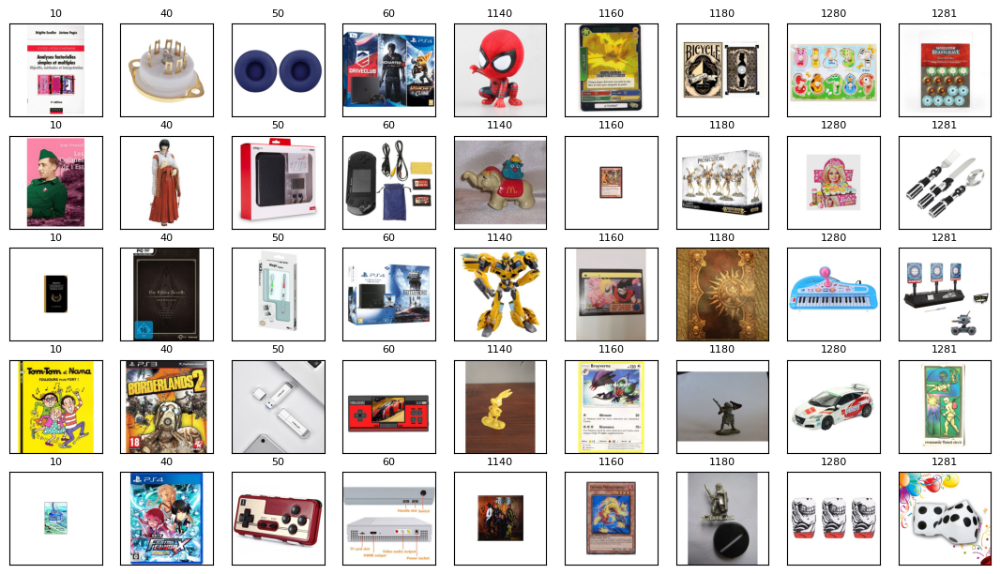

------------------------------------------------------------------------------------------------------------------------------------------------------


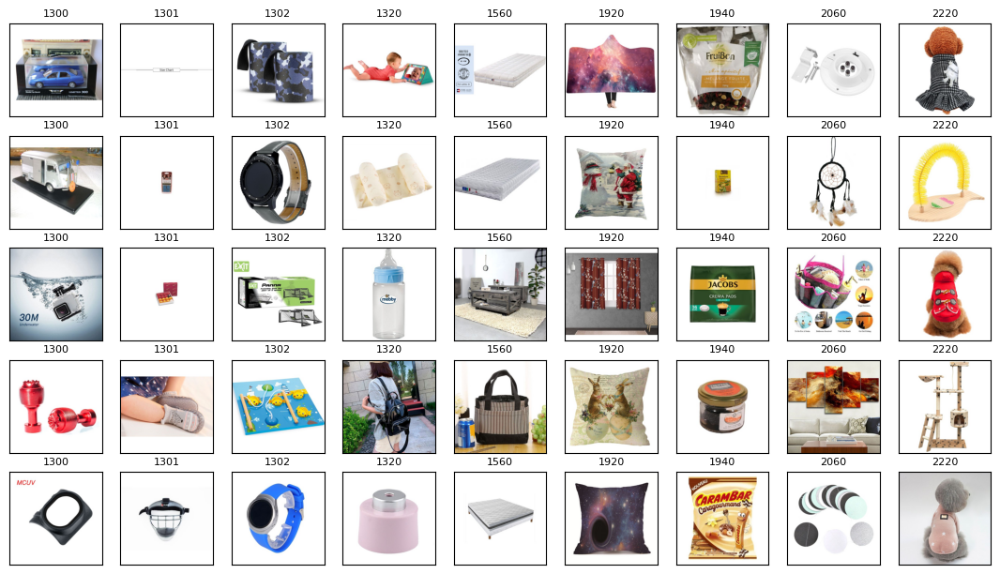

------------------------------------------------------------------------------------------------------------------------------------------------------


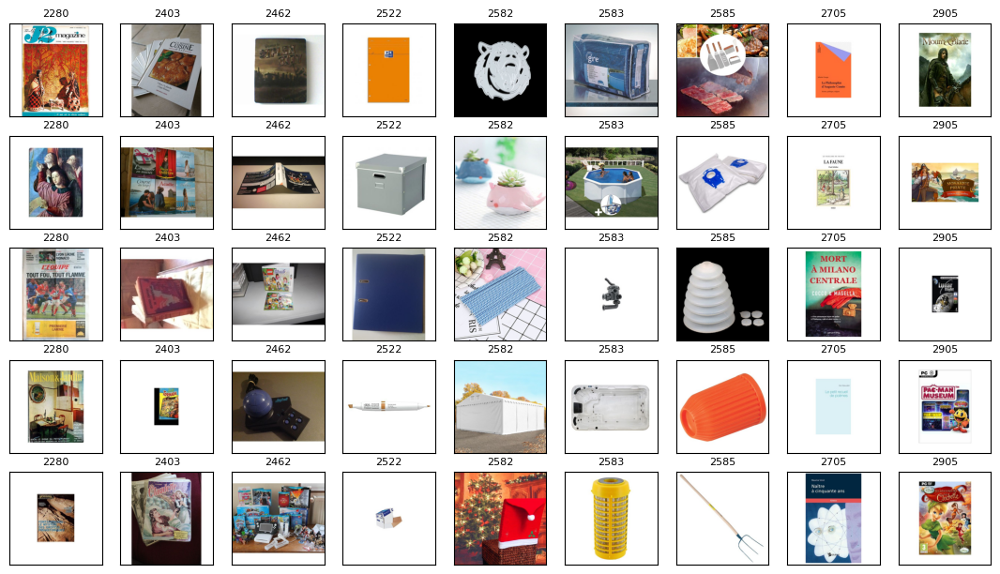

In [11]:
# max_load représente le nombre d'octet maxixum chargé en mémoire 10**9 => 1 Go
# le nombre d'images retourner se fera en fonction de ce paramètre

def images_read(impath, dsize=(500,500), grayscale=False, max_load=10**9):
    n = len(impath)
    total_size = n*dsize[0]*dsize[1] if grayscale else n*dsize[0]*dsize[1]*3
    stop = int(n * (max_load/total_size)) if total_size > max_load else n
    images = []
    # si c'est un Series il faut reindexé par 0, ... ,n pour pouvoir utiliser les indices de la même manière d'une liste
    if type(impath) == pd.Series:
        impath = impath.reset_index(drop=True)
    if grayscale:
        for i in range(stop):
            im = cv2.imread(impath[i], cv2.IMREAD_GRAYSCALE)
            images.append(cv2.resize(im, dsize = dsize))
    else:
        for i in range(stop):
            im = cv2.imread(impath[i], cv2.IMREAD_COLOR)
            # cv2 encodes les images aux formats BGR,
            # on les transforme en RGB pour les afficher correctement avec matplotlib 
            im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
            images.append(cv2.resize(im, dsize = dsize))
    return np.array(images)

def images_grid(images, nrows=5, ncols=10, cmap=None, titles=None, ordered_by_rows=True, axes_size=(1.5, 1.5)):
    fig, axes = plt.subplots(nrows, ncols, figsize=(axes_size[0]*ncols, axes_size[1]*nrows))
    axes = axes.flatten()
    if ordered_by_rows:
        axes_order = range(nrows*ncols)
    else:
        axes_order = [i*ncols + j for j in range(ncols) for i in range(nrows)]
    for i in range(nrows*ncols):
        k = axes_order[i]
        if i < len(images):
            axes[k].imshow(images[i], cmap=cmap)
            if titles:
                axes[k].set_title(titles[i], fontsize=8)
        axes[k].set_xticks([])
        axes[k].set_yticks([])
    plt.show()


N = 5  # nombre d'images par catégories

titles = []
paths = []

for code in np.sort(df['prdtypecode'].unique()):
    titles += [code] * N
    paths += list(df[df['prdtypecode'] == code]['image'].sample(N, random_state=42))
images = images_read(paths)
images_grid(images[:9*N], N, 9, titles=titles[:9*N], ordered_by_rows=False)
print('-'*150)
images_grid(images[9*N:18*N], N, 9, titles=titles[9*N:18*N], ordered_by_rows=False)
print('-'*150)
images_grid(images[18*N:], N, 9, titles=titles[18*N:], ordered_by_rows=False)

Nous allons maintenant donner un nom aux catégories identifiées dans la colonne *categories*

In [12]:
categories = {
    "Livres & Revues": {
        "Livres spécialisés": 10,
        "Littérature": 2705,
        "Presse & Magazines": 2280,
        "Séries & Encyclopédies": 2403,
    },

    "Jeux Vidéo": {
        "Rétro Gaming": 40,
        "Accessoires & Périphériques": 50,
        "Consoles": 60,
        "Jeux Vidéo Modernes": 2462,
        "Jeux PC en Téléchargement": 2905,
    },

    "Collection": {
        "Figurines": 1140,
        "Jeux de cartes": 1160,
        "Jeux de rôle & Figurines": 1180,
    },

    "Jouets, Jeux & Loisirs": {
        "Jouets & Figurines": 1280,
        "Jeux éducatifs": 1281,
        "Modélisme & Drones": 1300,
        "Loisirs & Plein air": 1302,
    },

    "Bébé": {
        "Vêtement Bébé & Loisirs": 1301,
        "Puériculture": 1320,
    },

    "Maison": {
        "Équipement Maison": 1560,
        "Textiles Maison": 1920,
        "Décoration & Lumières": 2060,
    },

    "Jardin & Extérieur": {
        "Décoration & Équipement Jardin": 2582,
        "Piscine & Accessoires": 2583,
        "Bricolage & Outillage": 2585,
    },

    "Autres": {
        "Épicerie": 1940,
        "Animaux": 2220,
        "Bureau & Papeterie": 2522,
    }
}

groups_mapper = {}
categories_mapper = {}
for group, g_categories in categories.items():
    for cat, code in g_categories.items():
        groups_mapper[code] = group
        categories_mapper[code] = cat

df['category'] = df['prdtypecode'].replace(categories_mapper)
df['group'] = df['prdtypecode'].replace(groups_mapper)

Nous allons également faire un nuage de mots par catégories celà permettra de contrôler le nomage de catégorie mais également de faire une première analyse sémantique. Pour générer les nuages de mots nous allons d'abord définir une liste stop_words des mots à exclure de nos nuages de mots, puis faire une vectorisation TF-IDF pour génerer les nuages de mots. "Ca permettra de rendre les nuages de mots plus spécifique à chaque catégorie" (à verifier si ça a un sens)

Méthode 1 : uniquement sur les catégories

In [13]:
stop_words = set(stopwords.words('french'))   # on récupère un stopwords adapté au français

# le paramètre ngram_range=(1,2) permet de récupérer unigramme et bigramme
# (par default c'est uniquement les unigrammes, i.e. séquence de un seul mot)
vectorizer = TfidfVectorizer(max_features=2000, stop_words=list(stop_words), ngram_range=(1,2))

text = (df["cleaned_designation"] + " " + df["cleaned_description"].fillna("")).str.lower()
tfidf = vectorizer.fit_transform(text)
tfidf = pd.DataFrame(tfidf.toarray(), columns=vectorizer.get_feature_names_out(), index=df.index)
tfidf["category"] = df["category"].values
tfidf["group"] = df["group"].values


# tf idf moyen par catégorie
means_by_cat = tfidf.drop('group', axis=1).groupby("category").mean()
freqs_cat = {
    cat : means_by_cat.loc[cat].sort_values(ascending=False)
    for cat in tfidf["category"].sort_values().unique()
}

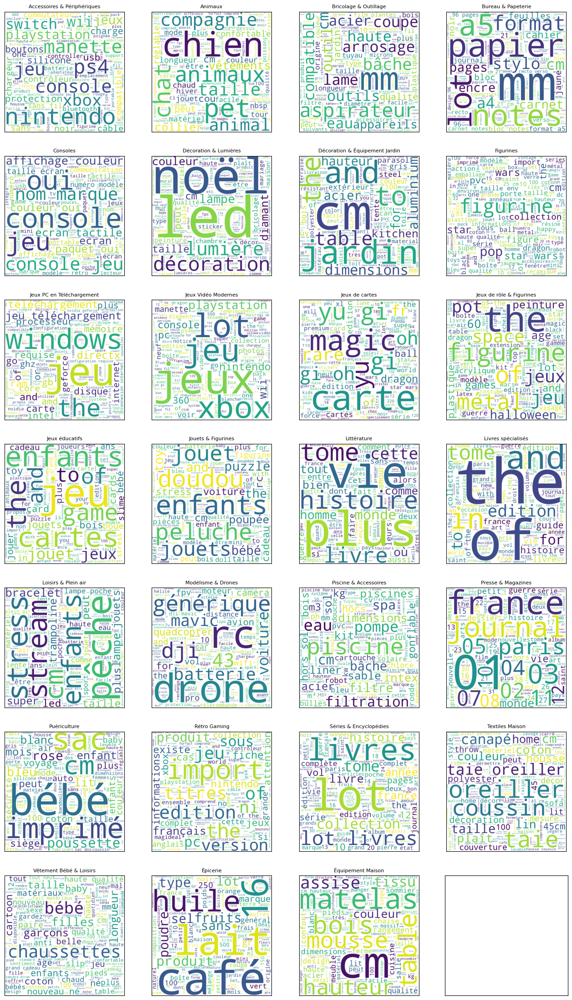

In [15]:
wc = [WordCloud(width=500, height=500, background_color="white").generate_from_frequencies(f) for f in freqs_cat.values()]
images_grid(wc, 7, 4, titles=list(freqs_cat), axes_size=(4,4))

Méthode 2 (comparaison de groupe puis intra-group avec tf-idf intra groupe)

In [21]:
freqs = {}
for gr in tfidf["group"].unique():
    mask = tfidf["group"] == gr
    freqs['groupe '+gr] = tfidf[mask].drop(['category', 'group'], axis=1).mean().sort_values(ascending=False)
    vectorizer = TfidfVectorizer(max_features=2000, stop_words=list(stop_words), ngram_range=(1,2))
    tfidfgr = vectorizer.fit_transform(text[mask])
    tfidfgr = pd.DataFrame(tfidfgr.toarray(), columns=vectorizer.get_feature_names_out(), index=df[mask].index)
    tfidfgr["category"] = df[mask]["category"].values
    means_by_cat = tfidfgr.groupby("category").mean()
    for cat in means_by_cat.index:
        freqs['intra '+gr+' - '+cat] = means_by_cat.loc[cat].sort_values(ascending=False)

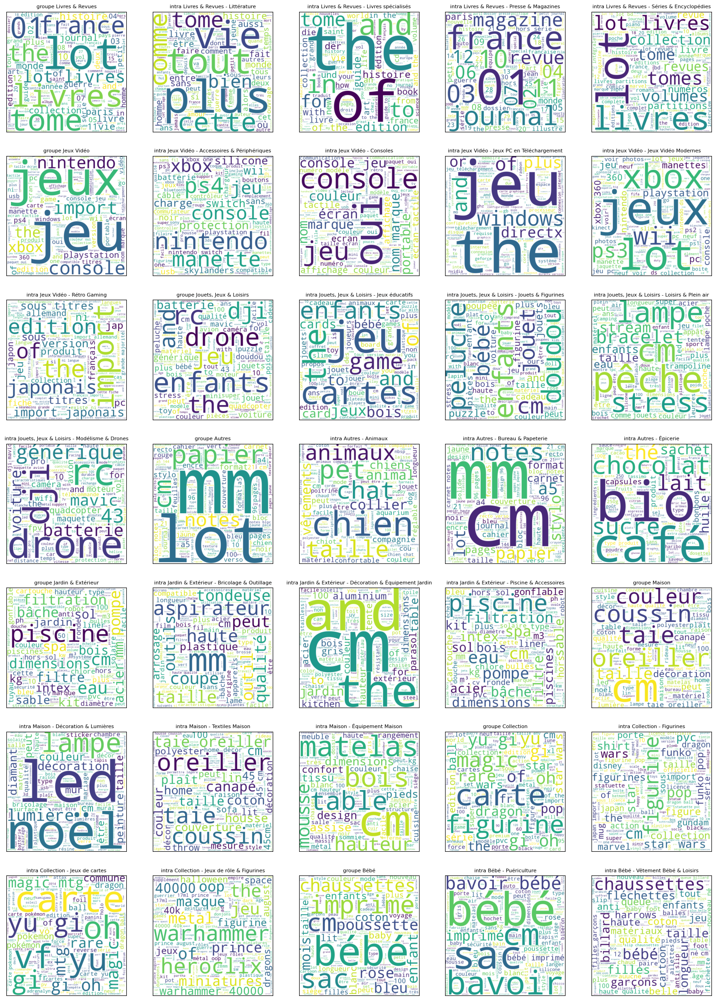

In [22]:
wc = [WordCloud(width=500, height=500, background_color="white").generate_from_frequencies(f) for f in freqs.values()]
images_grid(wc, 7, 5, titles=list(freqs), axes_size=(4,4))

Les nuages de mots semblent être en accord avec les catégories et groupes précédemment choisies. Maintenant que nous avons identifié les catégories et avant d'aller plus loin dans l'analyse sémantique, nous allons regarder la distribution des articles à travers les catégories.

# 5 - Distribution des produits par catégorie

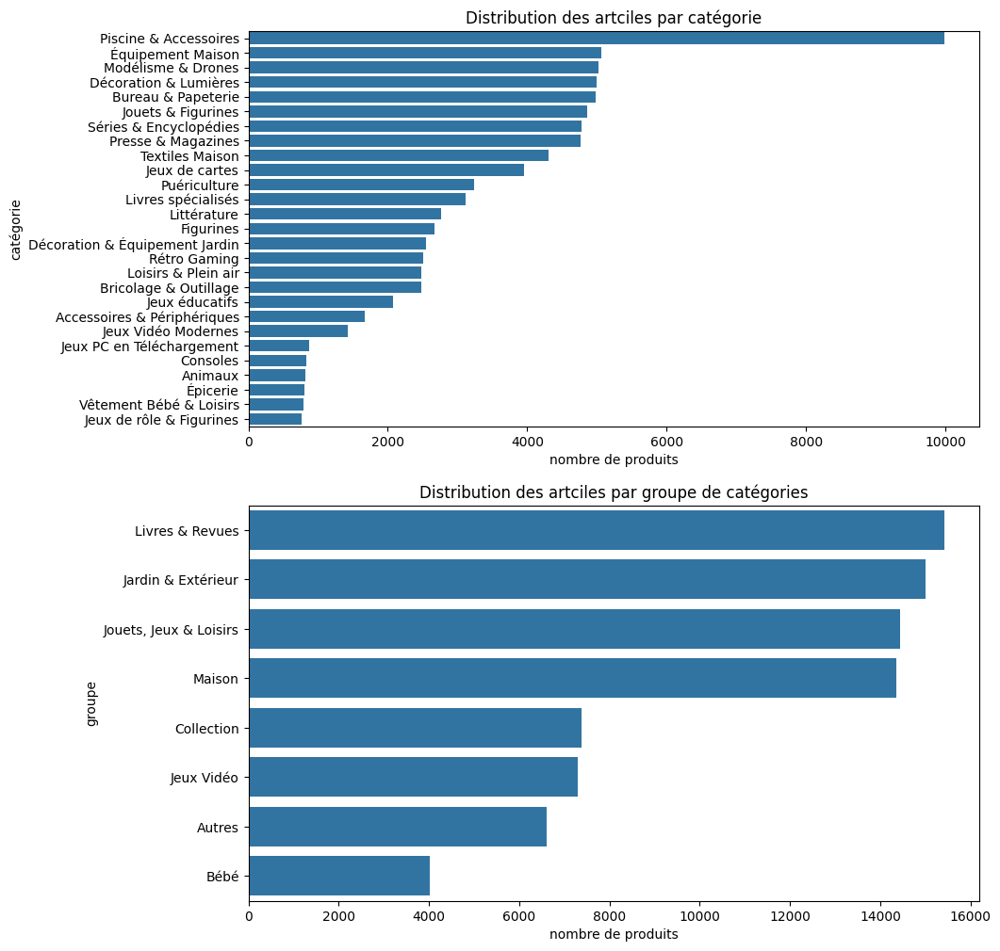

La catégorie la plus représentée est Piscine & Accessoires.
Elle à  13.1  fois plus d'articles que la catégorie Jeux de rôle & Figurines qui est la moins représentée.




In [18]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10,12))

cat_counts = df['category'].value_counts()
sns.barplot(x=cat_counts.values, y=cat_counts.index, ax=ax1)
ax1.set_ylabel('catégorie')
ax1.set_xlabel('nombre de produits')
ax1.set_title('Distribution des artciles par catégorie')

group_counts = df['group'].value_counts()
sns.barplot(x=group_counts.values, y=group_counts.index, ax=ax2)
ax2.set_ylabel('groupe')
ax2.set_xlabel('nombre de produits')
ax2.set_title('Distribution des artciles par groupe de catégories')

plt.show()

print(
    f"La catégorie la plus représentée est {cat_counts.index[0]}.\nElle à ",
    round(cat_counts.iloc[0]/cat_counts.iloc[-1],1),
    f" fois plus d'articles que la catégorie {cat_counts.index[-1]} qui est la moins représentée.\n\n"
)

Nous remarquons que le jeu de données est déséquilibré. Il sera donc important de stratifier notre jeu lors des splits entrainement / validation pour conserver la distribution dans chaucun de ces jeux et éviter d'avoir une classe ignoré car trop peux présente cela pourrait rendre les modèles pas performants sur certaines classes ou faussé l'évaulation car certaines classe y serait sous ou sur représentées. Nous avions vu que environ 30 000 description etait manquante. Nous allons maintenant regarder si certaines catégories on plus de description manquante que d'autre.

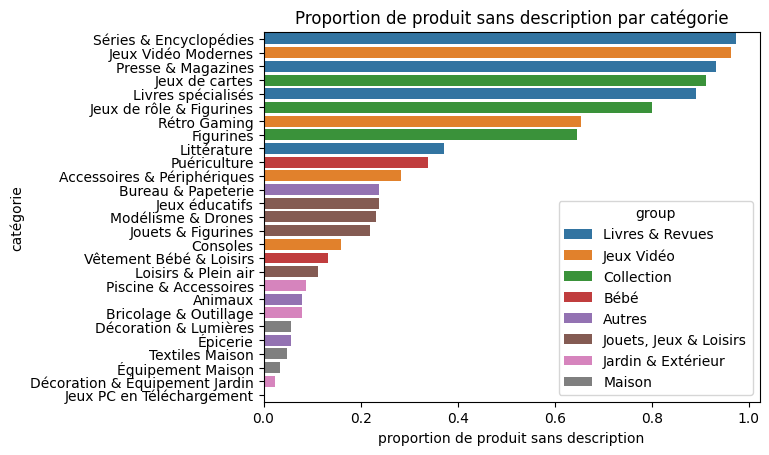

In [19]:
na_rates = df[df['description'].isna()][['group', 'category']].value_counts() / df[['group', 'category']].value_counts()
na_rates = na_rates.fillna(0).sort_values(ascending=False).reset_index()
sns.barplot(data=na_rates, x='count', y='category', hue='group')
plt.xlabel("proportion de produit sans description")
plt.ylabel("catégorie")
plt.title('Proportion de produit sans description par catégorie');

Ici on remarque que des catégories de produit comme les livres, les revues n'ont pas beaucoup de description, alors que les équipements de la maison ont en souvent. Cela semble cohérent en général seul le titre d'un livre est nécessaire alors que pour les équipements il est souvent utile de décrire les dimensions par exemple.

[expliquer pourquoi les jeux de PC n'ont aucune description]

In [ ]:
df["cleaned_description_len"] = df["cleaned_description"].apply(len)
len_means = df[~df['description'].isna()].groupby(['group', 'category'])["cleaned_description_len"].mean()
len_means = len_means.sort_values(ascending=False).reset_index()
sns.barplot(data=len_means, x='cleaned_description_len', y='category', hue='group')
plt.xlabel("nombre de caractères moyen des descriptions par catégorie")
plt.ylabel("catégorie")
plt.title('Longueur moyenne des descriptions par catégorie');

En plus d'avoir toujours des descriptions les jeux de PC en téléchargement semblent être très longue avec plus de 2000 caractères en moyenne.

# 5 - V2

La catégorie la plus représentée est Piscine & équipement de piscine.
Elle à  13.1  fois plus d'articles que la catégorie Jeux de rôle & figurines qui est la moins représentée.




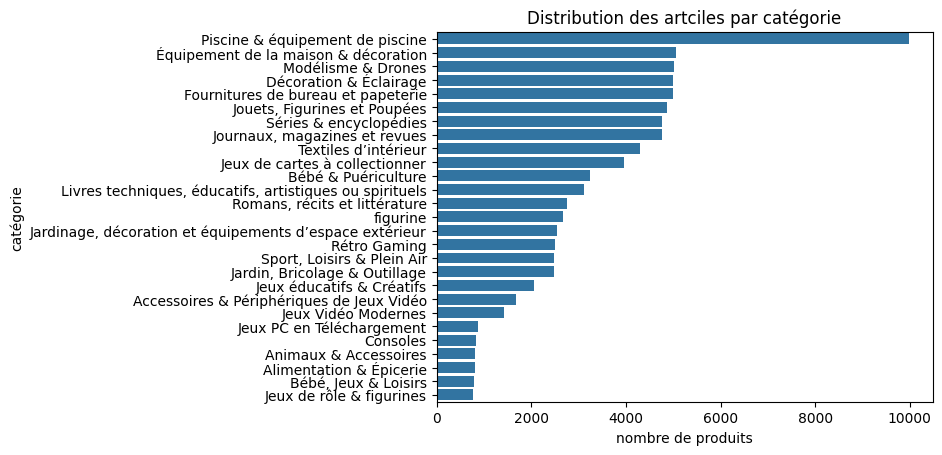

In [130]:
cat_counts = df['category'].value_counts()
sns.barplot(x=cat_counts.values, y=cat_counts.index)
plt.ylabel('catégorie')
plt.xlabel('nombre de produits')
plt.title('Distribution des artciles par catégorie')

print(
    f"La catégorie la plus représentée est {cat_counts.index[0]}.\nElle à ",
    round(cat_counts.iloc[0]/cat_counts.iloc[-1],1),
    f" fois plus d'articles que la catégorie {cat_counts.index[-1]} qui est la moins représentée.\n\n"
)

Nous remarquons que le jeu de données est déséquilibré. Il sera donc important de stratifier notre jeu lors des splits entrainement / validation pour conserver la distribution dans chaucun de ces jeux et éviter d'avoir une classe ignoré car trop peux présente cela pourrait rendre les modèles pas performants sur certaines classes ou faussé l'évaulation car certaines classe y serait sous ou sur représentées. Nous avions vu que environ 30 000 description etait manquante. Nous allons maintenant regarder si certaines catégories on plus de description manquante que d'autre.

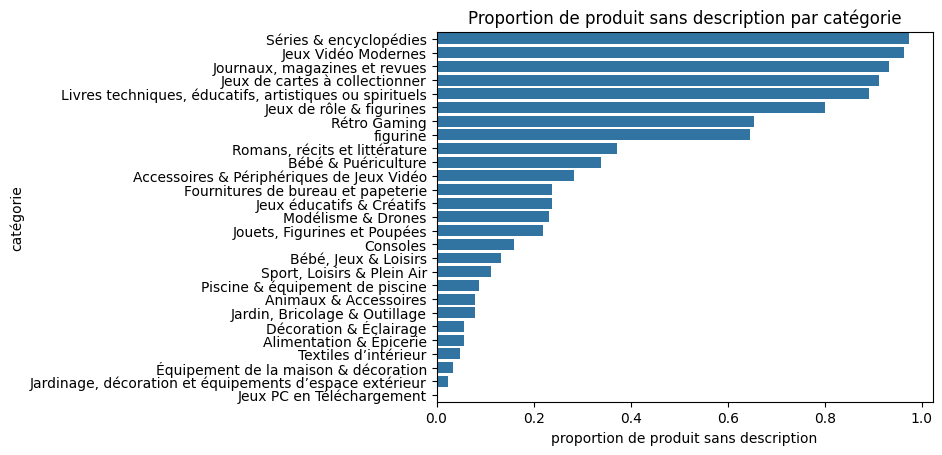

In [140]:
na_rates = (df[df['description'].isna()]['category'].value_counts() / df['category'].value_counts()).fillna(0).sort_values(ascending=False)
sns.barplot(na_rates, orient='h')
plt.xlabel("proportion de produit sans description")
plt.ylabel("catégorie")
plt.title('Proportion de produit sans description par catégorie');

Ici on remarque que des catégories de produit comme les livres, les revues n'ont pas beaucoup de description, alors que les équipements de la maison ont en souvent. Cela semble cohérent en général seul le titre d'un livre est nécessaire alors que pour les équipements il est souvent utile de décrire les dimensions par exemple.

[expliquer pourquoi les jeux de PC n'ont aucune description]


#### Choisir entre les 2 graphiques (je pense que le 2 est plus pertinent (à discuter))

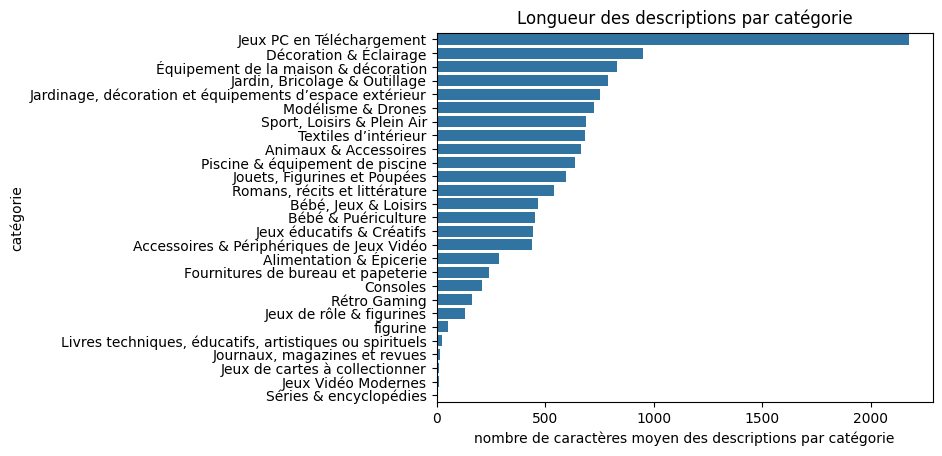

In [148]:
df["cleaned_description_len"] = df["cleaned_description"].apply(len)
len_means = df.groupby("category")["cleaned_description_len"].mean().sort_values(ascending=False)
sns.barplot(len_means, orient='h')
plt.xlabel("nombre de caractères moyen des descriptions par catégorie")
plt.ylabel("catégorie")
plt.title('Longueur des descriptions par catégorie');

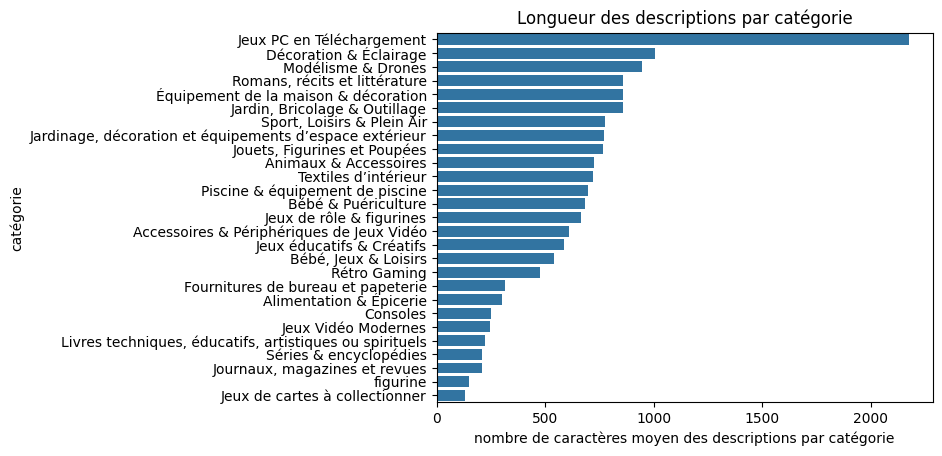

In [149]:
df["cleaned_description_len"] = df["cleaned_description"].apply(len)
len_means = df[~df['description'].isna()].groupby("category")["cleaned_description_len"].mean().sort_values(ascending=False)
sns.barplot(len_means, orient='h')
plt.xlabel("nombre de caractères moyen des descriptions par catégorie")
plt.ylabel("catégorie")
plt.title('Longueur des descriptions par catégorie');

En plus d'avoir toujours des descriptions les jeux de PC en téléchargement semblent être très longue avec plus de 2000 caractères en moyenne.

# 6 - Traitement des mauvaises classifications

Le jeu de données est brut et il y a beaucoup de produits classé dans la mauvaise catégorie. Nous allons donc etiqueté les produits qui semblent mal classifiés. Pour cela nous allons utiliser la vectorisation TF-IDF précedemment faite, puis utilisé un modèle de régression logistique entrainé sur les variables issues de la vectorisation et à l'aide de la librairie CleanLearning detecter les produits "suspects". Les données pour lesquels le modèle va prédire une autre classe avec une probabilité élevée seront etiqueté comme suspectes.

In [152]:
from cleanlab.classification import CleanLearning
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression

enc = LabelEncoder()                              # il faut encoder sinon ça provoque une erreur; pour k classes les labels doivent être 0,...,k-1
y = enc.fit_transform(tfidf["category"])
clf = LogisticRegression(solver='lbfgs', class_weight="balanced")   # class_weight="balanced" permet d'équilibrer les classes ???
cleaner = CleanLearning(clf)
cleaner.fit(tfidf.drop("category", axis=1), y)
label_issues = cleaner.get_label_issues()
print(f"{round(label_issues['is_label_issue'].sum()/len(df)*100, 2)} % sont prédit comme mal classifié.")

C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/p

0.1 % sont prédit comme mal classifié.


C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [190]:
label_issues.head()

,is_label_issue,label_quality,given_label,predicted_label,sample_weight
0,False,0.098761,17,7,1.799524
1,False,0.865579,16,16,1.114513
2,False,0.453971,0,0,1.199173
3,False,0.717718,15,15,1.274566
4,False,0.136140,20,13,1.102282


In [214]:
df['is_label_issue'] = label_issues['is_label_issue']

In [189]:
# exemple d'un produit mal prédit mais pas tagué. Ici la prédiction semble correcte.
# Même si il est personnalisé il s'agit d'un article de papeterie et ce n'est pas un livre.

i = 0

print("produit non étiqueté comme problèmatique.")
print(f"Catégorie du produit : {enc.inverse_transform(label_issues.iloc[i:i+1]['given_label'])[0]}")
print(f"Catégorie de produit prédite : {enc.inverse_transform(label_issues.iloc[i:i+1]['predicted_label'])[0]}")

display_df(df.iloc[i:i+1][['designation', 'description', 'image']])

i = 49

print("produit étiqueté comme problèmatique.")
print(f"Catégorie du produit : {enc.inverse_transform(label_issues.iloc[i:i+1]['given_label'])[0]}")
print(f"Catégorie de produit prédite : {enc.inverse_transform(label_issues.iloc[i:i+1]['predicted_label'])[0]}")

display_df(df.iloc[i:i+1][['designation', 'description', 'image']])

produit non étiqueté comme problèmatique.
Catégorie du produit : Livres techniques, éducatifs, artistiques ou spirituels
Catégorie de produit prédite : Fournitures de bureau et papeterie


,designation,description,image
productid,,,
3804725264,Olivia: Personalisiertes Notizbuch / 150 Seiten / Punktraster / Ca Din A5 / Rosen-Design,NaN,


produit étiqueté comme problèmatique.
Catégorie du produit : Jouets, Figurines et Poupées
Catégorie de produit prédite : Décoration & Éclairage


,designation,description,image
productid,,,
3748234383,100pcs Premium Bâtons Bracelets Neon Light Glowing Party Favors Rallye Raves 9062 @Cocoworld,100PCS premium Bâtons Bracelets Neon Light Party Favors Glowing Rallye Raves Nous ne proposons pas le choix de la couleur et le style nous vous ferons parvenir le produit au hasard espérons que vous pouvez comprendre Feature: 100% tout neuf et haute. Quantité: 100PCS Couleur: Une variété de mélange de couleur aléatoire Mode d'emploi: doucement seulement une pause le liquide dans les bâtons de Glo-alors mélanger immédiatement tube fluoresce.1 instantanée à l'intérieur de l'articulation a été adaptée faciliter plusieurs extension illimitée aussi peut être transformé en notre coloré une grande variété peut être utilisé pour: concerts salles de danse anniversaire fête mariage fête fête vacances célébration randonnée pédestre camping lieux tels que l'éclairage et la décoration bâtons Glo-appartient à la taille : 05cm X 20cm contenu: 100PCS bâtons lumineux haut de gamme Bracelets Neon Light Party Favors Glowing Rallye Raves,


Certaine articles sont mal tagué mais ça permet d'avoir une base. (on pourrait taguer à partir de variable plus performante ??)

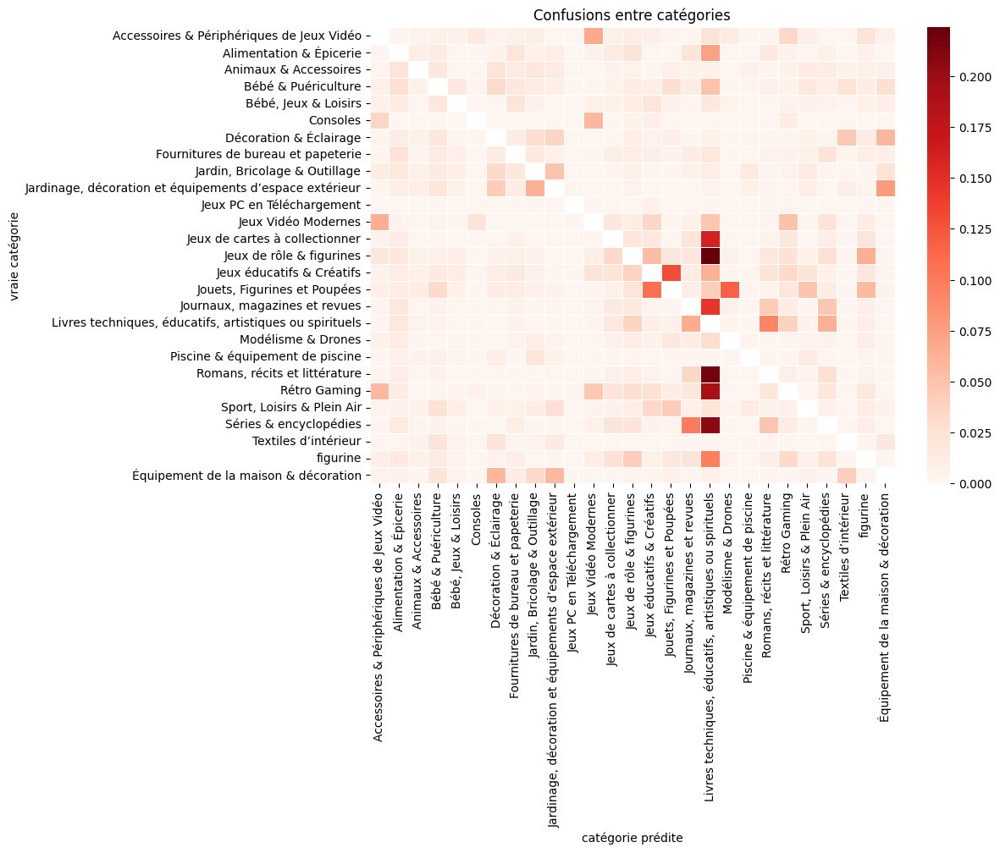

In [213]:
ct = pd.crosstab(
    label_issues["given_label"],
    label_issues["predicted_label"],
    normalize="index",
)
ct.columns = enc.inverse_transform(ct.columns)
ct.index = enc.inverse_transform(ct.index)

mask = np.eye(len(ct), dtype=bool)

plt.figure(figsize=(10, 7))
sns.heatmap(ct, cmap="Reds", mask=mask, linewidths=.5)
plt.ylabel("vraie catégorie")
plt.xlabel("catégorie prédite")
plt.title("Confusions entre catégories")
plt.show()

On peut remarquer que les catégories Jeux éducatif et Jouets, figurine semblent se confondre. Surement du à une proximité.

# 7 - Analyse sémantique



## 7a- proportion de mots par catégorie

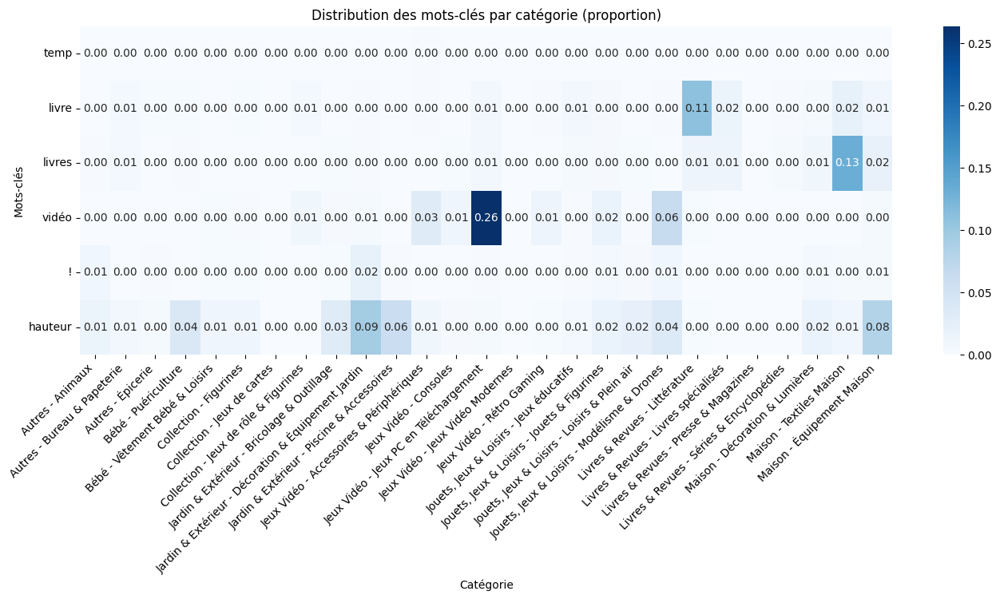

In [24]:
import re

# def plot_keywords_heatmap(df, keywords, text_col="text"):
#     category_codes = sorted(df["prdtypecode"].unique())
#     result = pd.DataFrame(index=keywords, columns=category_codes, dtype=float)
#     for kw in keywords:
#         pattern = fr"\b{re.escape(kw)}\b"
#         contains_kw = df[text_col].astype(str).str.contains(pattern, na=False)
#         freq = contains_kw.groupby(df["prdtypecode"]).mean()
#         result.loc[kw, freq.index] = freq.values
#     col_labels = [categories.get(code, str(code)) for code in category_codes]
#     result_for_plot = result.copy()
#     result_for_plot.columns = col_labels
#     plt.figure(figsize=(14, len(keywords) * 0.6 + 4))
#     sns.heatmap(result_for_plot.astype(float), annot=True, fmt=".2f", cmap="Blues")
#     plt.title("Distribution des mots-clés par catégorie (proportion)")
#     plt.xlabel("Catégorie")
#     plt.ylabel("Mots-clés")
#     plt.xticks(rotation=45, ha="right")
#     plt.yticks(rotation=0)
#     plt.tight_layout()
#     plt.show()

def plot_keywords_heatmap(df, keywords, text_col="text", by="prdtypecode"):
    category_codes = sorted(df[by].unique())
    result = pd.DataFrame(index=keywords, columns=category_codes, dtype=float)
    for kw in keywords:
        pattern = fr"\b{re.escape(kw)}\b"
        contains_kw = df[text_col].astype(str).str.contains(pattern, na=False)
        freq = contains_kw.groupby(df[by]).mean()
        result.loc[kw, freq.index] = freq.values
    col_labels = [categories.get(code, str(code)) for code in category_codes]
    result_for_plot = result.copy()
    result_for_plot.columns = col_labels
    plt.figure(figsize=(14, len(keywords) * 0.6 + 4))
    sns.heatmap(result_for_plot.astype(float), annot=True, fmt=".2f", cmap="Blues")
    plt.title("Distribution des mots-clés par catégorie (proportion)")
    plt.xlabel("Catégorie")
    plt.ylabel("Mots-clés")
    plt.xticks(rotation=45, ha="right")
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

keywords = ["temp", "livre", "livres", "vidéo", "!", "hauteur",
            # "piscine", "drone", "bébé", "tout",
            # "led", "&", "couleur",
            # "coussin", "décoration", "matelas", "jouets", "oreiller",
           ]
df['text'] = df['cleaned_designation'] + ' ' + df['cleaned_description']
df['group_cat'] = df['group'] + ' - ' + df['category']
plot_keywords_heatmap(df, keywords, by='group_cat')


# résultat incohérent avec livres 

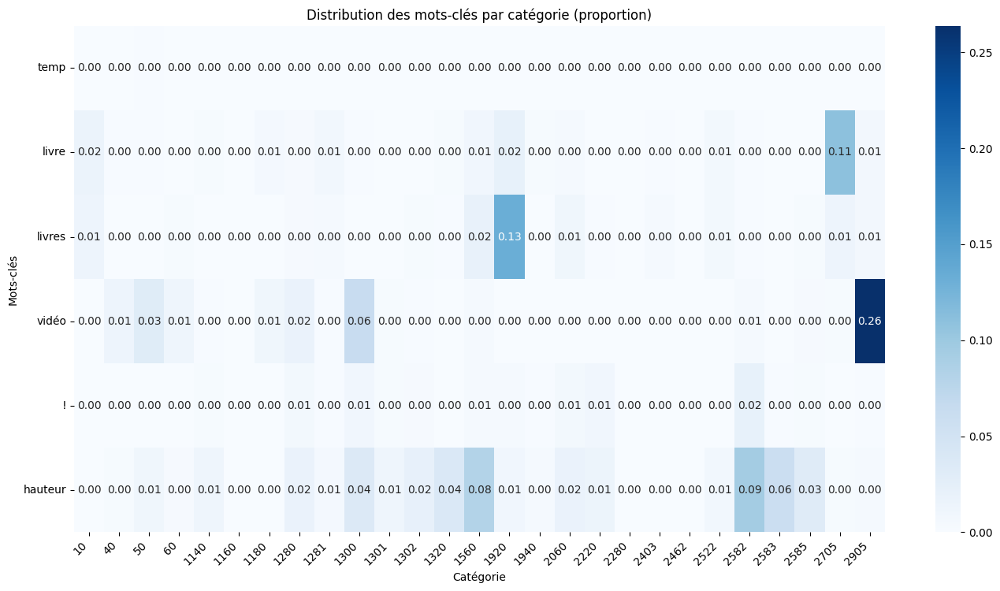

In [26]:
def plot_keywords_heatmap(df, keywords, text_col="text"):
    category_codes = sorted(df["prdtypecode"].unique())
    result = pd.DataFrame(index=keywords, columns=category_codes, dtype=float)
    for kw in keywords:
        pattern = fr"\b{re.escape(kw)}\b"
        contains_kw = df[text_col].astype(str).str.contains(pattern, na=False)
        freq = contains_kw.groupby(df["prdtypecode"]).mean()
        result.loc[kw, freq.index] = freq.values
    col_labels = [categories.get(code, str(code)) for code in category_codes]
    result_for_plot = result.copy()
    result_for_plot.columns = col_labels
    plt.figure(figsize=(14, len(keywords) * 0.6 + 4))
    sns.heatmap(result_for_plot.astype(float), annot=True, fmt=".2f", cmap="Blues")
    plt.title("Distribution des mots-clés par catégorie (proportion)")
    plt.xlabel("Catégorie")
    plt.ylabel("Mots-clés")
    plt.xticks(rotation=45, ha="right")
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

keywords = ["temp", "livre", "livres", "vidéo", "!", "hauteur",
            # "piscine", "drone", "bébé", "tout",
            # "led", "&", "couleur",
            # "coussin", "décoration", "matelas", "jouets", "oreiller",
           ]
df['text'] = df['cleaned_designation'] + ' ' + df['cleaned_description']
df['group_cat'] = df['group'] + ' - ' + df['category']
plot_keywords_heatmap(df, keywords)

In [29]:
display_df(df[df['prdtypecode']==1920],3)

,prdtypecode,designation,description,image,cleaned_designation,cleaned_description,hashed_image,category,group,text,group_cat
productid,,,,,,,,,,,
1882164320,1920,Paire De Voilages Imprimés Fantaisie,Paire de voilages droits fantaisie qui mettra votre intérieur en valeurUn parement uni à petits coeurs suivi d'un petit galon coloré en forme également de coeur qui viendra faire la jonction avec la partie inférieure rayée ton sur ton en coloris écru2 coloris: gris et rouge2 dimensions: 60 x 120 cm et 60 x 160 cmFinition de tête a ourlet passe tringlePrêt-à-poserLa base et les côtés sont ourlés Caractéristiques:Coloris: gris et rougeFinition: ourlet à passe tringleComposition: 73% polyester et 27% cotonDimensions: 60 x 120 cm et 60 x 160 cm Vendu à la pairePrêt-à-poser,,Paire De Voilages Imprimés Fantaisie,Paire de voilages droits fantaisie qui mettra votre intérieur en valeurUn parement uni à petits coeurs suivi d'un petit galon coloré en forme également de coeur qui viendra faire la jonction avec la partie inférieure rayée ton sur ton en coloris écru2 coloris gris et rouge2 dimensions 60 x 120 cm et 60 x 160 cmFinition de tête a ourlet passe tringlePrêt à poserLa base et les côtés sont ourlés Caractéristiques Coloris gris et rougeFinition ourlet à passe tringleComposition 73% polyester et 27% cotonDimensions 60 x 120 cm et 60 x 160 cm Vendu à la pairePrêt à poser,7924509782586961760,Textiles Maison,Maison,Paire De Voilages Imprimés Fantaisie Paire de voilages droits fantaisie qui mettra votre intérieur en valeurUn parement uni à petits coeurs suivi d'un petit galon coloré en forme également de coeur qui viendra faire la jonction avec la partie inférieure rayée ton sur ton en coloris écru2 coloris gris et rouge2 dimensions 60 x 120 cm et 60 x 160 cmFinition de tête a ourlet passe tringlePrêt à poserLa base et les côtés sont ourlés Caractéristiques Coloris gris et rougeFinition ourlet à passe tringleComposition 73% polyester et 27% cotonDimensions 60 x 120 cm et 60 x 160 cm Vendu à la pairePrêt à poser,Maison - Textiles Maison
4012748163,1920,4pcs Décor Coussin Indépendance Style Jeter Covers Taie D'oreiller,"4pcs Décor Coussin Independence Day Style de Throw Taie d'oreiller Couvre vente de produits Point: Il peut être utilisé pour décorer le salon faire paraître à la maison chaleur plus confortable. Coussin décoratif couverture utilisé pour 18x18 pouces oreiller inserts (pls noter: Les insertions ne sont pas inclus et le motif de peinture d'un seul côté). taies d'oreiller facile de faire correspondre votre canapé canapé autre pillows.Soft et durable pour les deux à l'intérieur (salon bureau chambre etc.) et à l'extérieur (terrasse voiture etc.). Fermeture à glissière cachée Conçu draps en coton Coussin Coffre-fort à la machine wash.Or par lavage à sec hand.Dot Non Bleach.Tumble Low.Do Non fer. Fait de draps en coton durable et écologique Materials.Keep votre place propre et Throw Pillow contre zéro les traces de doigts. Description Matériel: Coton Lin (approx.): 18 ""x18"" / 45cm * 45cm La taille peut avoir un écart de 0.5-2cm en raison de produit par date. Remarque: S'il vous plaît permettre erreur mineure en raison de la mesure manuelle. En raison de la différence entre les différents moniteurs l'image peut ne pas refléter la couleur réelle de l'article. Le forfait comprend: 4pcs Taie d'oreiller (non coussin intérieur inclus)",,4pcs Décor Coussin Indépendance Style Jeter Covers Taie D'oreiller,"4pcs Décor Coussin Independence Day Style de Throw Taie d'oreiller Couvre vente de produits Point Il peut être utilisé pour décorer le salon faire paraître à la maison chaleur plus confortable Coussin décoratif couverture utilisé pour 18x18 pouces oreiller inserts (pls noter Les insertions ne sont pas inclus et le motif de peinture d'un seul côté) taies d'oreiller facile de faire correspondre votre canapé canapé autre pillows Soft et durable pour les deux à l'intérieur (salon bureau chambre etc ) et à l'extérieur (terrasse voiture etc ) 

## 7a - Gestion du language

Certaines description sont écrit dans d'autre langue. Nous allons créer une variable comprenant la langue detecté (à l'aide de la librairie detect) et une avec la description nettoyé traduite (nous vérifirons par la suite si celle ci pourrait amélioré certains modèles)

In [238]:
from langdetect import detect, DetectorFactory
from deep_translator import GoogleTranslator

# Fixe la graine pour des résultats reproductibles
DetectorFactory.seed = 0

# Fonction de détection
def detect_lang(text):
    try:
        return detect(text)
    except:
        return "unknown"


# fonction de traduction
def translate_to_fr(text, lang):
    if lang in ['fr', 'unknown']:
        return text
    else:
        return GoogleTranslator(source=lang, target='fr').translate(text)

In [ ]:
stop_words = set(stopwords.words('french'))   # on récupère un stopwords adapté au français

# le paramètre ngram_range=(1,2) permet de récupérer unigramme et bigramme
# (par default c'est uniquement les unigrammes, i.e. séquence de un seul mot)
vectorizer = TfidfVectorizer(max_features=2000, stop_words=list(stop_words), ngram_range=(1,2))

text = (df["cleaned_designation"] + " " + df["cleaned_description"].fillna("")).str.lower()
tfidf = vectorizer.fit_transform(text)

tfidf = pd.DataFrame(tfidf.toarray(), columns=vectorizer.get_feature_names_out(), index=df.index)
tfidf["category"] = df["category"].values
means_by_prdtypecode = tfidf.groupby("category").mean()
freqs = {
    cat : means_by_prdtypecode.loc[cat].sort_values(ascending=False)
    for cat in tfidf["category"].sort_values().unique()
}

df["detected_lang"] = (df["cleaned_designation"] + ' ' + df["cleaned_description"].fillna("")).apply(detect_lang)

# bcp trop long à tourner
# df["cleaned_designation_fr"] = df.apply(lambda x: translate_to_fr(x["cleaned_designation"], x["detected_lang"]), axis=1)
# df["cleaned_description_fr"] = df.apply(lambda x: translate_to_fr(x["cleaned_description"], x["detected_lang"]), axis=1)

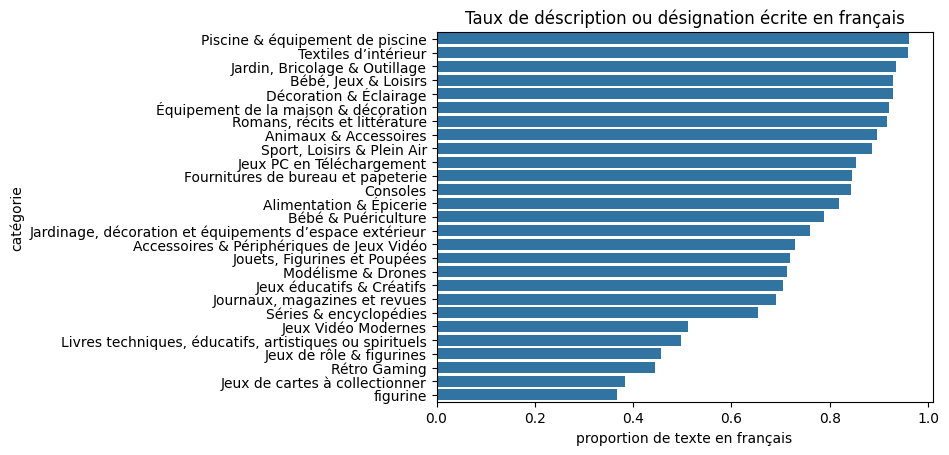

In [231]:
fr_rate = df[df["detected_lang"] == 'fr']['category'].value_counts() / df[df["detected_lang"] != 'unknown']['category'].value_counts()
sns.barplot(fr_rate.sort_values(ascending=False), orient='h')
plt.title("Taux de déscription ou désignation écrite en français")
plt.ylabel('catégorie')
plt.xlabel('proportion de texte en français');

In [ ]:
# vectorizer = TfidfVectorizer(max_features=2000, stop_words=list(stop_words), ngram_range=(1,2))

# text = (df["cleaned_designation_fr"] + " " + df["cleaned_description_fr"].fillna("")).str.lower()
# tfidf = vectorizer.fit_transform(text)

# tfidf = pd.DataFrame(tfidf.toarray(), columns=vectorizer.get_feature_names_out(), index=df.index)
# tfidf["category"] = df["category"].values
# means_by_prdtypecode = tfidf.groupby("category").mean()
# freqs = {
#     cat : means_by_prdtypecode.loc[cat].sort_values(ascending=False)
#     for cat in tfidf["category"].sort_values().unique()
# }

# wc = [WordCloud(width=500, height=500, background_color="white").generate_from_frequencies(f) for f in freqs.values()]
# images_grid(wc, 7, 4, titles=list(freqs), axes_size=(4,4))

In [ ]:
df.to_csv("modified_df.csv")

Insérer les graphiques de Xiaosong

Faire une fonction d'analyses des sémantiques et qui sort des groupes de mots qui distingue par catégorie ou par groupe de catégorie

Test de potentielles features

In [10]:
from sklearn.feature_selection import RFECV
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import make_scorer, f1_score

# def select(X, y, plot=True):
#     f1_weighted = make_scorer(f1_score, average='weighted')
#     selector = RFECV(estimator=LogisticRegression(max_iter=20, multi_class='multinomial'), cv=StratifiedKFold(5), scoring=f1_weighted, n_jobs=-1)
#     selector.fit(X, y)
#     if plot==True:
#         plt.plot([i for i in range(X.shape[1], 0, -1)], selector.cv_results_['mean_test_score'])
#         plt.show()
#     return selector


def select(X, y, plot=True):
    selector = RFECV(estimator=LogisticRegression(max_iter=20), cv=StratifiedKFold(5), scoring='f1', n_jobs=-1)
    selector.fit(X, y)
    if plot==True:
        plt.plot([i for i in range(X.shape[1], 0, -1)], selector.cv_results_['mean_test_score'])
        plt.show()
    return selector

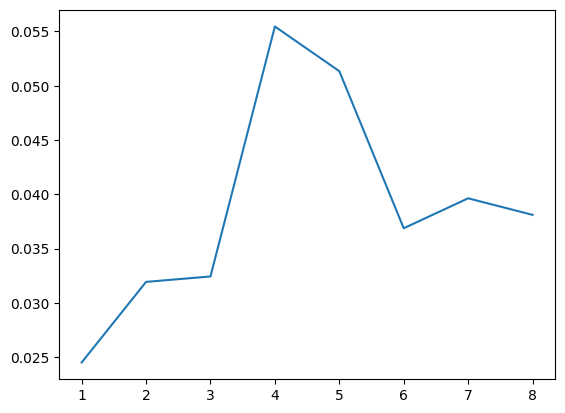

cat 10 à un socre de 0.05545671033191683 avec les mots :
['of' 'and' 'in' 'tome' 'edition']
----------------------------------------


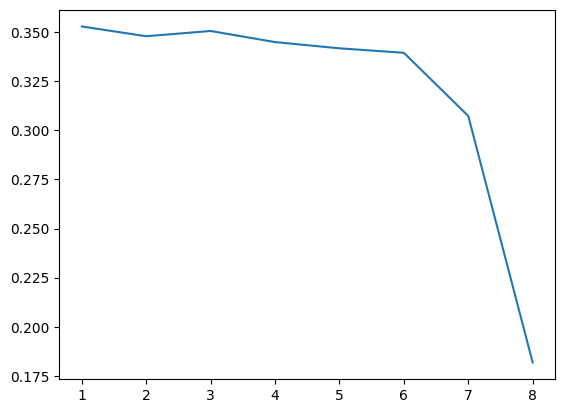

cat 40 à un socre de 0.35292521296593937 avec les mots :
['import' 'the' 'edition' 'of' 'titres' 'jeu' 'ni' 'version']
----------------------------------------


C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/prepr

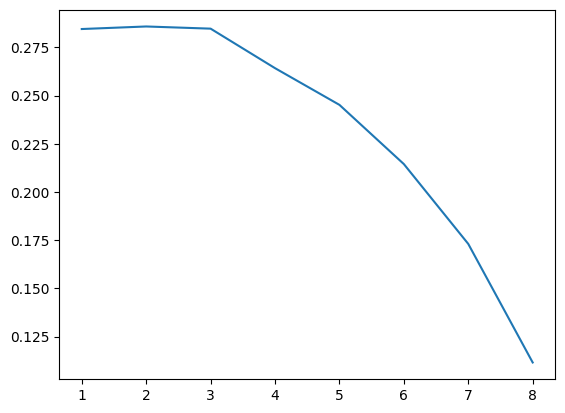

cat 50 à un socre de 0.2858903788874928 avec les mots :
['nintendo' 'ps4' 'manette' 'console' 'xbox' 'wii' 'switch']
----------------------------------------


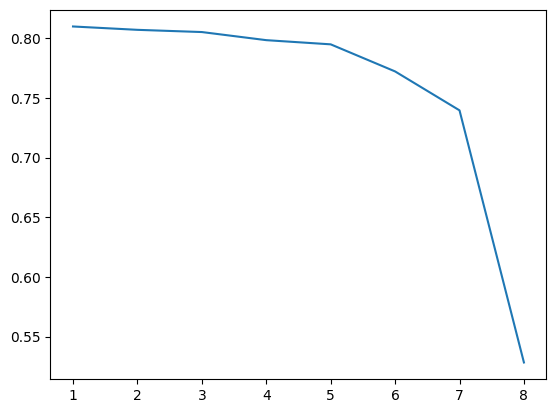

cat 60 à un socre de 0.8098414500003648 avec les mots :
['console' 'oui' 'jeu' 'console jeu' 'nom marque' 'affichage couleur'
 'ecran tactile' 'ecran']
----------------------------------------


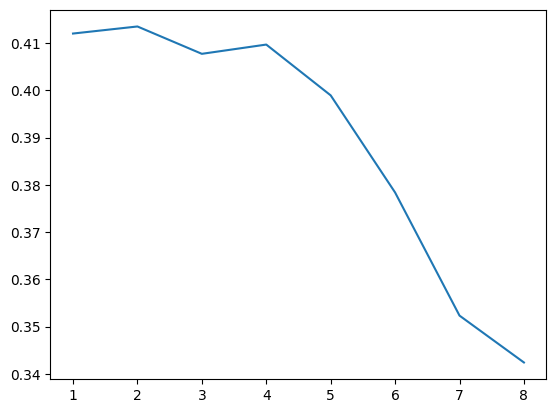

cat 1140 à un socre de 0.4135099695295043 avec les mots :
['figurine' 'pop' 'cm' 'star' 'wars' 'star wars' 'pvc']
----------------------------------------


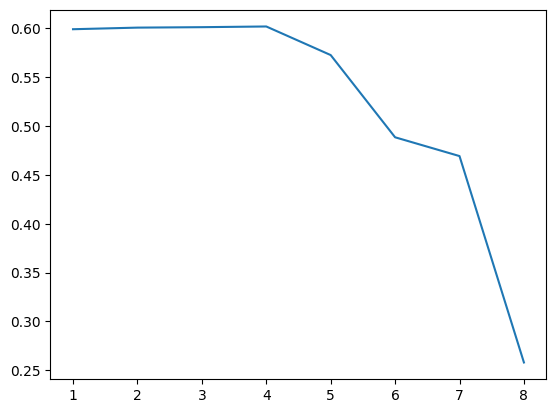

cat 1160 à un socre de 0.6018313625662801 avec les mots :
['carte' 'magic' 'yu' 'yu gi' 'rare']
----------------------------------------


C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


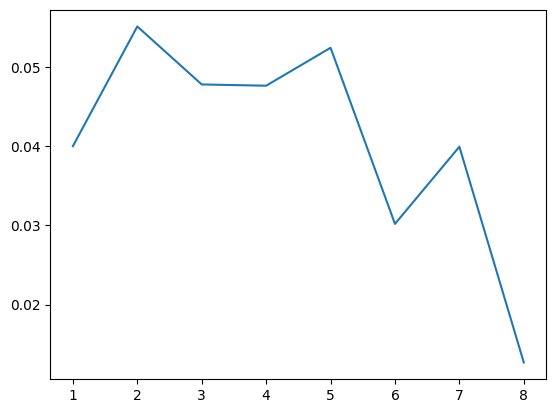

cat 1180 à un socre de 0.05508734746004611 avec les mots :
['figurine' 'of' 'métal' 'jeu' 'space' 'pot' 'jeux']
----------------------------------------


C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/prepr

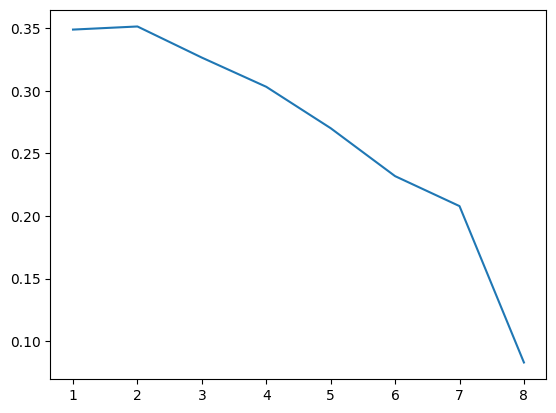

cat 1280 à un socre de 0.35142760944275964 avec les mots :
['enfants' 'doudou' 'peluche' 'jouet' 'jouets' 'puzzle' 'toy']
----------------------------------------


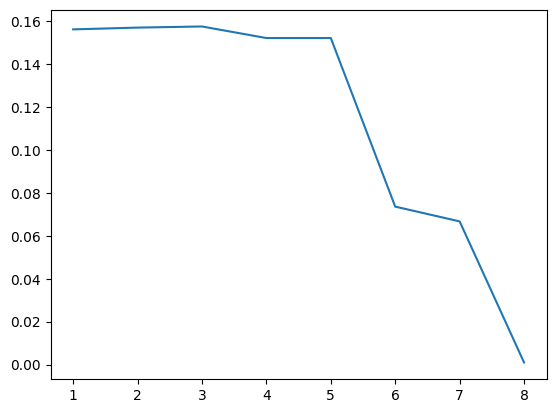

cat 1281 à un socre de 0.15763727560028157 avec les mots :
['jeu' 'enfants' 'cartes' 'the' 'game' 'to']
----------------------------------------


C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/prepr

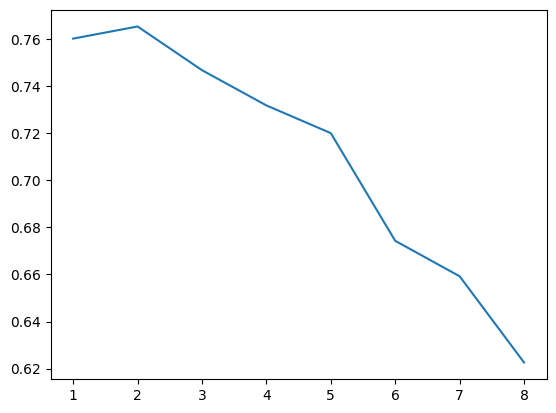

cat 1300 à un socre de 0.765372660320916 avec les mots :
['drone' 'rc' 'générique' 'dji' '43' 'batterie' 'voiture']
----------------------------------------


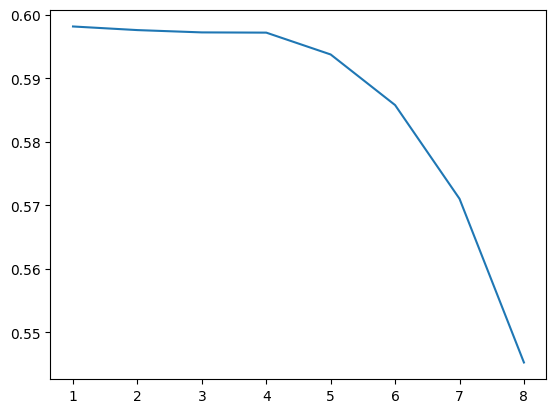

cat 1301 à un socre de 0.5981321560020791 avec les mots :
['chaussettes' 'bébé' 'filles' 'longueur' 'garçons' 'taille' 'cartoon'
 'coton']
----------------------------------------


C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/prepr

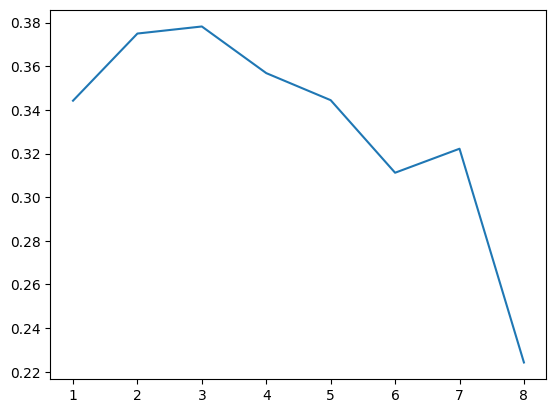

cat 1302 à un socre de 0.37824558846380646 avec les mots :
['pêche' 'stress' 'stream' 'cm' 'bracelet' 'lampe']
----------------------------------------


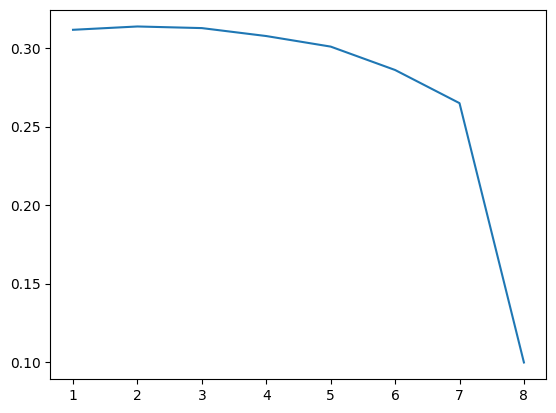

cat 1320 à un socre de 0.3137625774403602 avec les mots :
['bébé' 'sac' 'imprimé' 'poussette' 'rose' 'bleu' 'lit']
----------------------------------------


C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/prepr

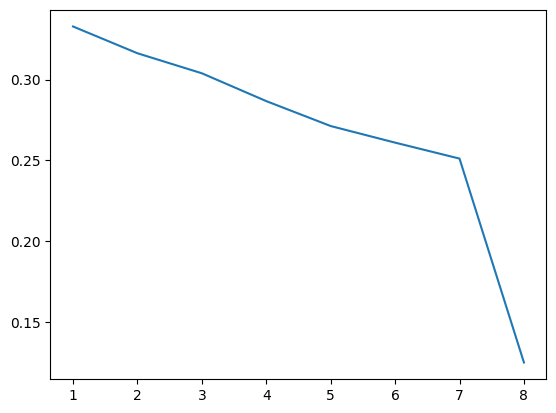

cat 1560 à un socre de 0.3329576322442626 avec les mots :
['cm' 'matelas' 'bois' 'table' 'mousse' 'hauteur' 'assise' 'tissu']
----------------------------------------


C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


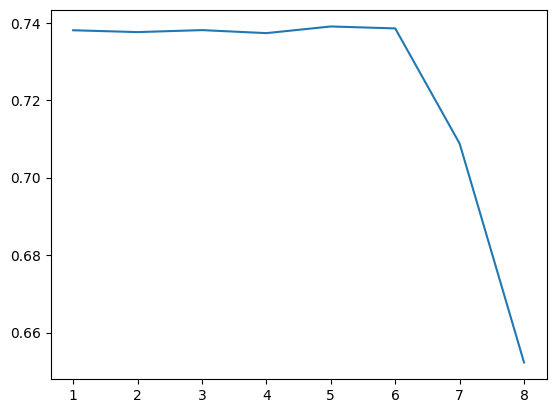

cat 1920 à un socre de 0.7390249341709038 avec les mots :
['oreiller' 'taie' 'coussin' 'taille']
----------------------------------------


C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/prepr

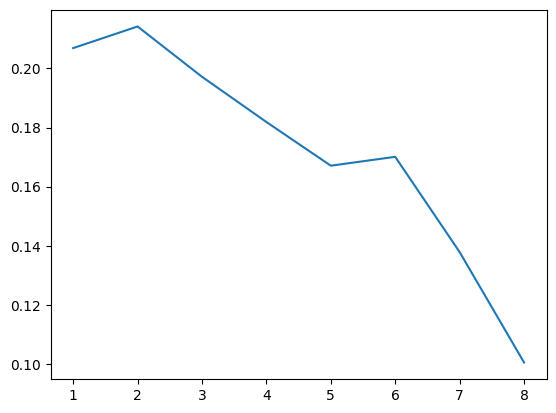

cat 1940 à un socre de 0.21420187015558695 avec les mots :
['café' 'lait' '16' 'huile' 'produit' 'fruits' 'poudre']
----------------------------------------


C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/prepr

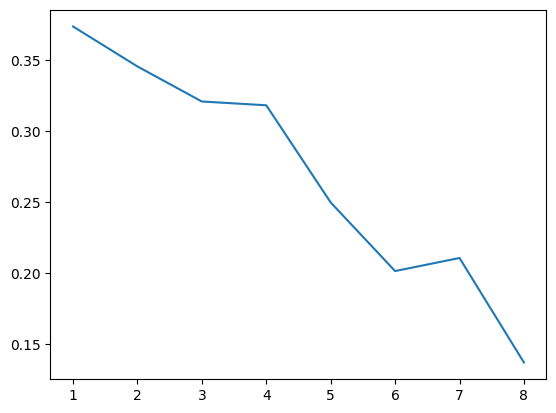

cat 2060 à un socre de 0.3737249047405008 avec les mots :
['led' 'décoration' 'noël' 'lumière' 'lampe' 'couleur' 'diamant' 'taille']
----------------------------------------


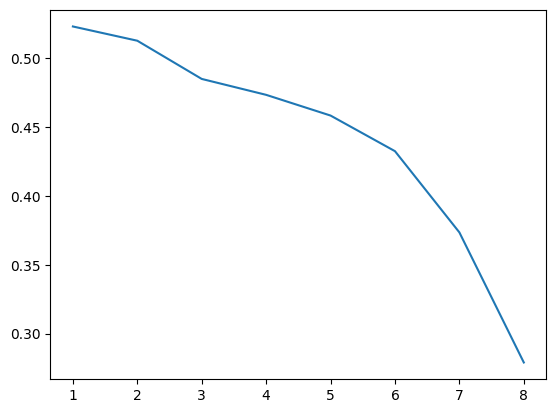

cat 2220 à un socre de 0.5229736930686325 avec les mots :
['chien' 'pet' 'chat' 'animaux' 'compagnie' 'taille' 'animal' 'vêtements']
----------------------------------------


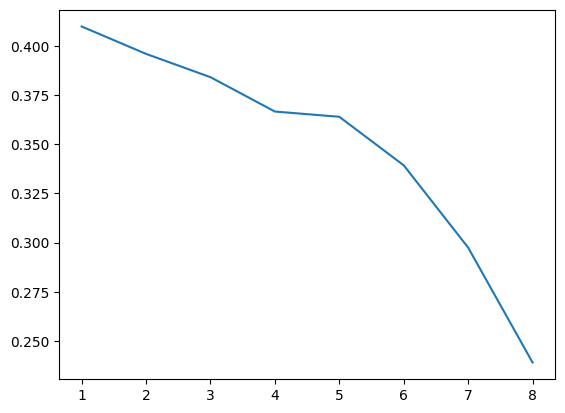

cat 2280 à un socre de 0.40989936139564714 avec les mots :
['01' 'france' 'journal' '03' 'paris' '11' '02' '07']
----------------------------------------


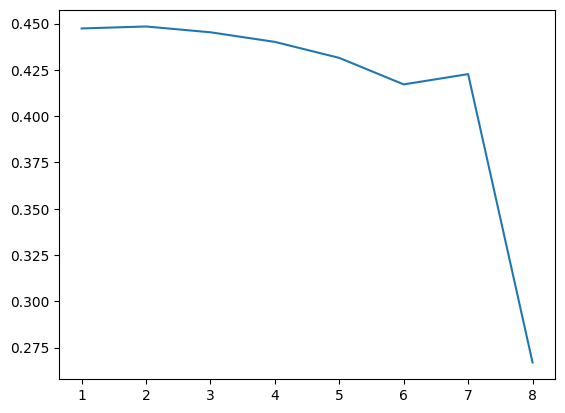

cat 2403 à un socre de 0.4483975280822312 avec les mots :
['lot' 'livres' 'lot livres' 'tome' 'histoire' 'livre' 'année']
----------------------------------------


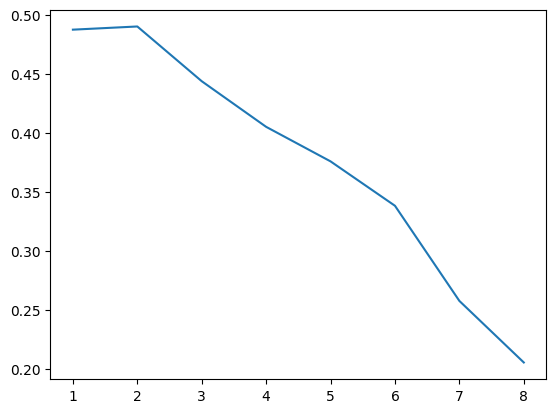

cat 2462 à un socre de 0.49011226622769427 avec les mots :
['jeux' 'lot' 'jeu' 'xbox' 'playstation' 'wii' 'nintendo']
----------------------------------------


C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/prepr

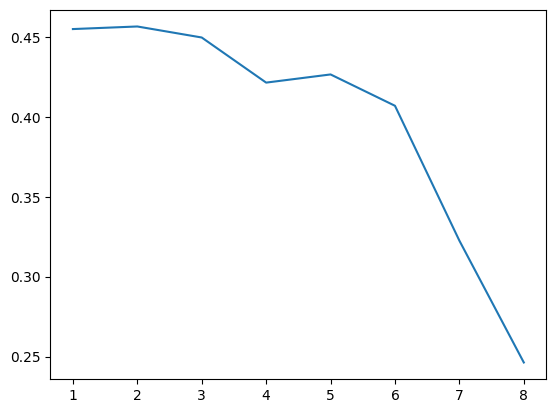

cat 2522 à un socre de 0.4565623411872526 avec les mots :
['mm' 'papier' 'lot' 'notes' 'a5' 'format' 'stylo']
----------------------------------------


C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/prepr

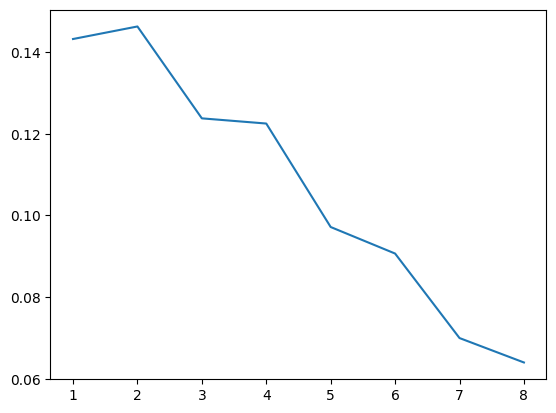

cat 2582 à un socre de 0.14625330436674405 avec les mots :
['cm' 'jardin' 'and' 'to' 'table' 'dimensions' 'aluminium']
----------------------------------------


C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/prepr

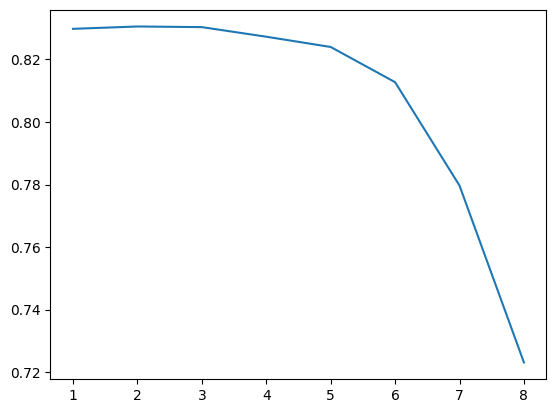

cat 2583 à un socre de 0.8305404903958292 avec les mots :
['piscine' 'eau' 'pompe' 'filtration' 'spa' 'bâche' 'filtre']
----------------------------------------


C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/prepr

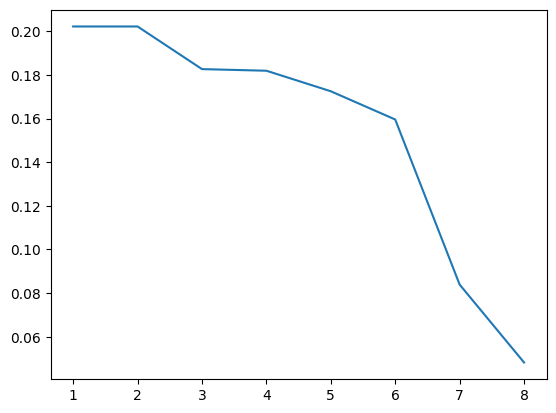

cat 2585 à un socre de 0.2022273826630509 avec les mots :
['mm' 'aspirateur' 'bâche' 'coupe' 'outil' 'arrosage' 'compatible']
----------------------------------------


C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\gabyd\anaconda3\envs\ds_rakuten\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 20 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=20).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/prepr

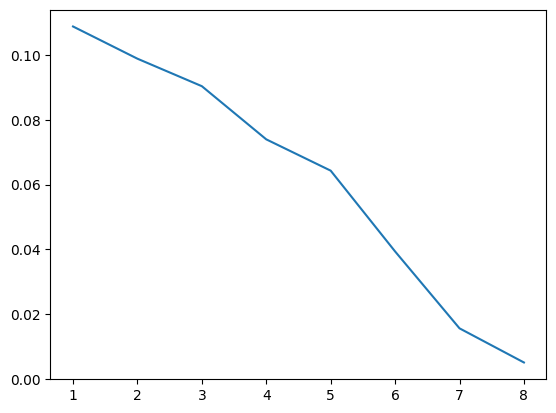

cat 2705 à un socre de 0.10885870346523667 avec les mots :
['plus' 'vie' 'histoire' 'tome' 'livre' 'cette' 'monde' 'homme']
----------------------------------------


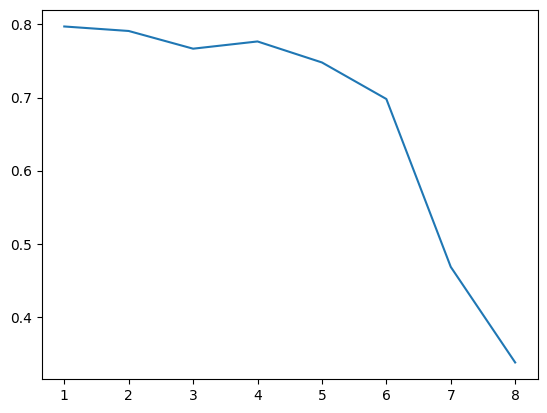

cat 2905 à un socre de 0.7972144581685444 avec les mots :
['jeu' 'windows' 'the' 'jeu téléchargement' 'téléchargement' 'directx'
 'of' 'and']
----------------------------------------


In [13]:
from sklearn.preprocessing import LabelEncoder

N = 8
# enc = LabelEncoder()
# y = enc.fit_transform(tfidf["prdtypecode"])

for cat in sorted(list(tfidf["prdtypecode"].unique())):
    X = tfidf[freqs[str(cat)].iloc[:N].index]
    y = np.where(tfidf["prdtypecode"]==cat, 1, 0)
    selector = select(X, y)
    print(f"cat {cat} à un socre de {max(selector.cv_results_['mean_test_score'])} avec les mots :")
    print(selector.get_feature_names_out())
    print("-"*40)

score 0.81 pour cat 60 avec ['console' 'oui' 'jeu' 'console jeu' 'nom marque' 'affichage couleur'
 'ecran tactile' 'ecran']

 score de 0.76 pour cat 1300 avec ['drone' 'rc' 'générique' 'dji' '43' 'batterie' 'voiture']

 score de 0.6 pour cat 1301 avec ['chaussettes' 'bébé' 'filles' 'longueur' 'garçons' 'taille' 'cartoon'
 'coton']

 score de 0.74 pour cat 1920 avec ['oreiller' 'taie' 'coussin' 'taille']

 cat 2583 à un socre de 0.83 avec les mots :
['piscine' 'eau' 'pompe' 'filtration' 'spa' 'bâche' 'filtre']

socre de 0.79 pour cat 2905 avec ['jeu' 'windows' 'the' 'jeu téléchargement' 'téléchargement' 'directx'
 'of' 'and']